# SARSA Implementation for Cliff Walking Environment

## Sarsa Implementation

In [74]:
import gym
from collections import defaultdict
from collections import namedtuple
import numpy as np
import itertools
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import os

In [41]:
# create env : https://github.com/openai/gym/blob/master/gym/envs/toy_text/cliffwalking.py
cliffwalking_env = gym.make('CliffWalking-v0')
cliffwalking_env.render()
EpisodeStats = namedtuple("Stats", ["episode_lengths", "episode_rewards"])

o  o  o  o  o  o  o  o  o  o  o  o
o  o  o  o  o  o  o  o  o  o  o  o
o  o  o  o  o  o  o  o  o  o  o  o
x  C  C  C  C  C  C  C  C  C  C  T



In [102]:
def argmax(numpy_array):
    """ argmax implementation that chooses randomly between ties """
    return np.random.choice(np.flatnonzero(numpy_array == numpy_array.max()))

def createFolderIfDoesntExist(folderName):
    exists = os.path.isdir(folderName)
    if not exists:
        os.makedirs(folderName)      
    return exists


def td_plot_values(Q, folder,algor_name="", state_shape=((4, 12))):
    """ helper method to plot a heat map of the states """

    values = np.zeros((4 * 12))
    max_a = [0 for _ in range(values.shape[0])]
    for key, value in Q.items():
        values[key] = max(value)
        max_a[key] = int(argmax(value))

    def optimal_move(i, j):
        left, right, down, up = (
            i, max(j - 1, 0)), (i, min(11, j + 1)), (min(3, i + 1), j), (max(0, i - 1), j)
        arr = np.array([values[up], values[right], values[down], values[left]])
        if i == 2 and j != 11:
            arr[2] = -9999
        if i == 0:
            arr[0] = -999
        if j == 0:
            arr[3] = -999
        if j == 11:
            arr[1] = -999
        return argmax(arr)

    # reshape the state-value function
    values = np.reshape(values, state_shape)
    # plot the state-value function
    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(111)
    im = ax.imshow(values, cmap=matplotlib.cm.coolwarm)
    arrows = ['↑', '→', '↓', '←']
    index = 0
    for (j, i), label in np.ndenumerate(values):
        ax.text(i, j, np.round(label, 3),
                ha='center', va='center', fontsize=12)
        if j != 3 or i == 0:
            ax.text(i, j + 0.4, arrows[optimal_move(j, i)],
                    ha='center', va='center', fontsize=12, color='black')
        index += 1
    plt.tick_params(bottom=False, left=False,
                    labelbottom=False, labelleft=False)
    plt.title(algor_name + ': State-Value Function')
    createFolderIfDoesntExist(folder)
    fig.savefig(algor_name + "_td_plot_values.png")
    plt.show(block=False)
    
def make_epsilon_greedy_policy(Q, epsilon, nA):
    """
    Creates an epsilon-greedy policy based on a given Q-function and epsilon.

    Args:
        Q: A dictionary that maps from state -> action-values.
            Each value is a numpy array of length nA (see below)
        epsilon: The probability to select a random action . float between 0 and 1.
        nA: Number of actions in the environment.

    Returns:
        A function that takes the observation as an argument and returns
        the probabilities for each action in the form of a numpy array of length nA.

    """
    def policy_fn(observation):
        action_prob = np.ones(nA) * (epsilon / nA)
        index_best = argmax(Q[observation])
        action_prob[index_best] += (1 - epsilon)
        return action_prob
    return policy_fn


In [116]:
def SARSA(env, num_episodes, lambda_, discount_factor=1.0, epsilon=0.1, alpha=0.5, print_=False):
    """
    SARSA algorithm: On-policy TD control. Finds the optimal greedy policy
    while following an epsilon-greedy policy

    Args:
        env: OpenAI environment.
        num_episodes: Number of episodes to run for.
        discount_factor: Gamma discount factor.
        alpha: TD learning rate.
        epsilon: Chance the sample a random action. Float betwen 0 and 1.
        print_: print every num of episodes - don't print anything if False

    Returns:
        A tuple (Q, episode_lengths).
        Q is the optimal action-value function, a dictionary mapping state -> action values.
        stats is an EpisodeStats object with two numpy arrays for episode_lengths and episode_rewards.
    """
    # A nested dictionary that maps state -> (action -> action-value).
    Q = defaultdict(lambda: np.zeros(env.action_space.n))

    # The policy we're following
    policy = make_epsilon_greedy_policy(Q, epsilon, env.action_space.n)

    # Keeps track of useful statistics
    stats = EpisodeStats(
        episode_lengths=np.zeros(num_episodes),
        episode_rewards=np.zeros(num_episodes))

    for i_episode in range(num_episodes):
        if(print_ and ((i_episode + 1) % 100 == 0)):
            print("\rEpisode {}/{}.".format(i_episode + 1, num_episodes), end="")

        state = env.reset()
        action_probs = policy(state)
        action = np.random.choice(
            np.arange(len(action_probs)), p=action_probs)

        for j in itertools.count():
            next_state, reward, done, info = env.step(action)
            next_action_probs = policy(next_state)
            next_action = np.random.choice(
                np.arange(len(next_action_probs)), p=next_action_probs)

            # Update statistics after getting a reward - use within loop, call the following lines
            stats.episode_rewards[i_episode] += reward
            stats.episode_lengths[i_episode] = j

            # TD update
            Q[state][action] = Q[state][action] + alpha * \
                (reward + lambda_ * discount_factor *
                 Q[next_state][next_action] - Q[state][action])
            state = next_state
            action = next_action
            
           
            if done:
                break
        if(print_ == True):
            td_plot_values(Q,f"./images/lambda_{lambda_}",f"./images/lambda_{lambda_}/SARSA_{i_episode}")
    return Q, stats

In [121]:
def runSarsa(num_episodes,lambda_,discount_factor,epsilon,alpha,print_=False,plot_episode_ret=False,num_runs=1):
    all_episode_stats = []
    for i in range(num_runs):
        print(f'SARSA_run_{i}\n')
        sarsa_q_values, stats_sarsa = SARSA(cliffwalking_env, lambda_=lambda_,num_episodes=num_episodes,
                                            discount_factor=discount_factor, epsilon=epsilon,
                                            alpha=alpha, print_=print_)
        all_episode_stats.append(stats_sarsa)
    return all_episode_stats

## Heatmap showing best actions for different lambdas

SARSA



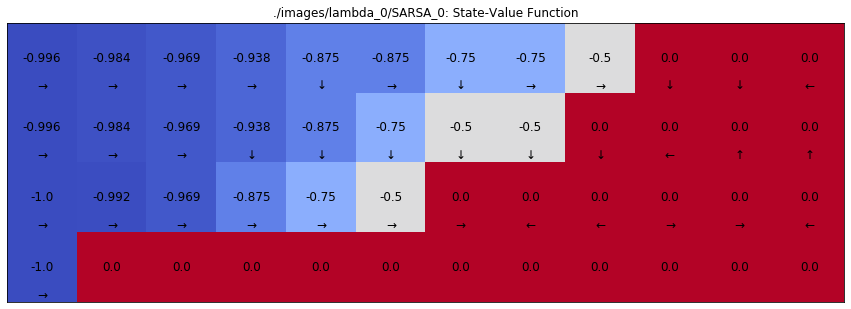

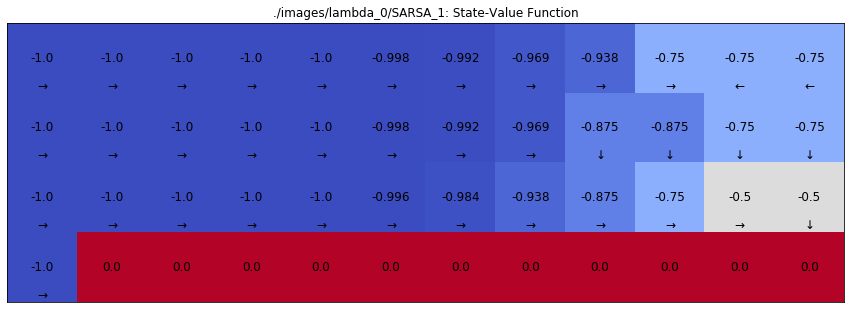

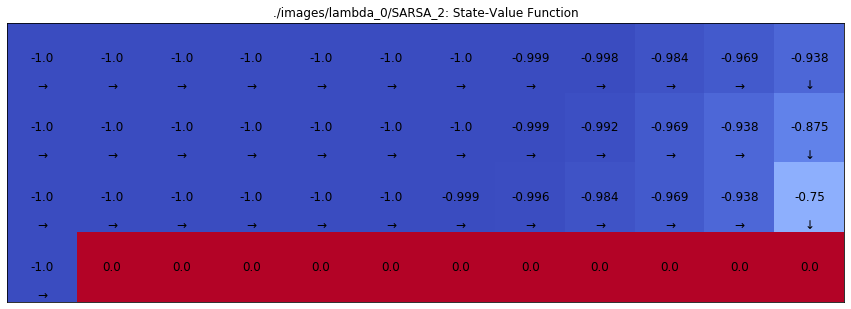

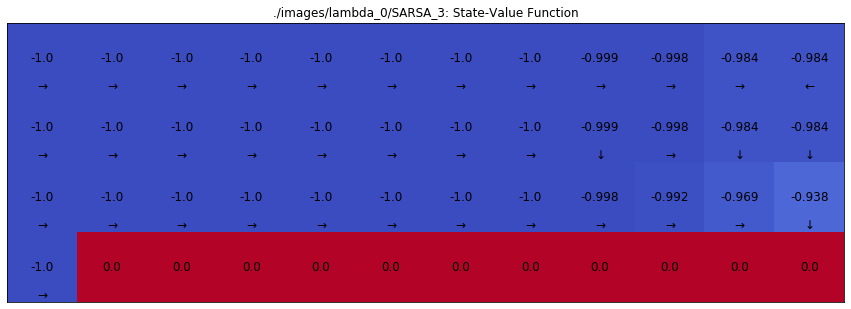

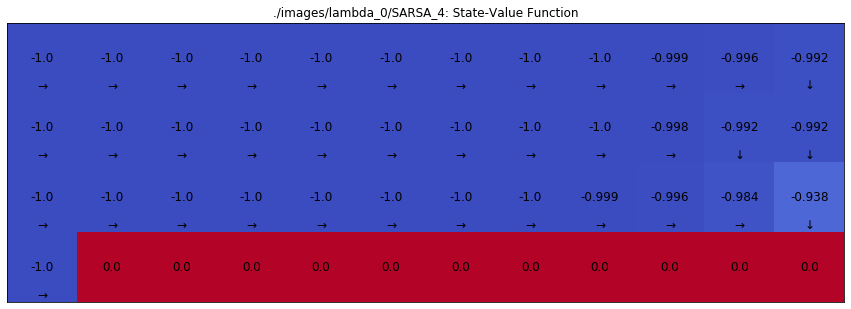

...

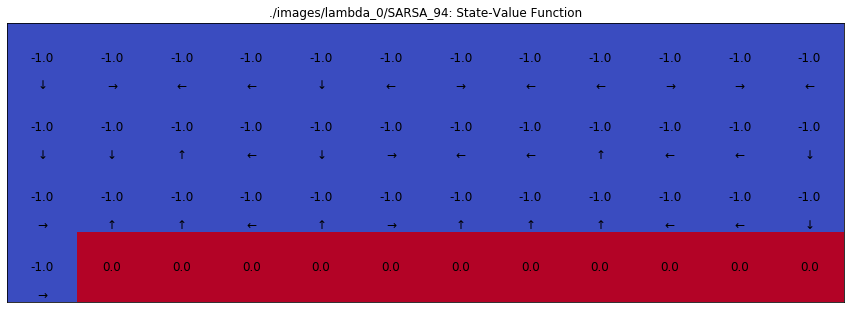

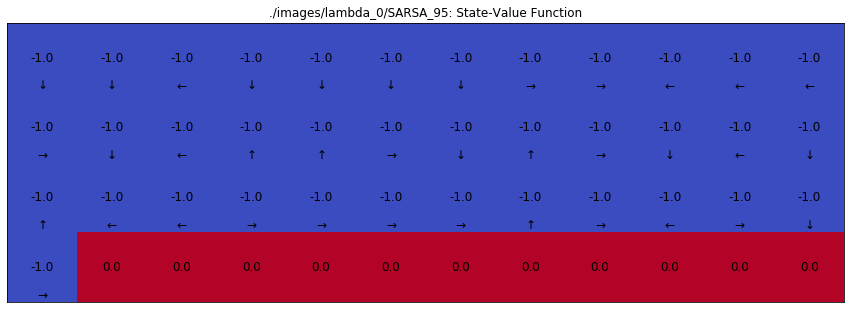

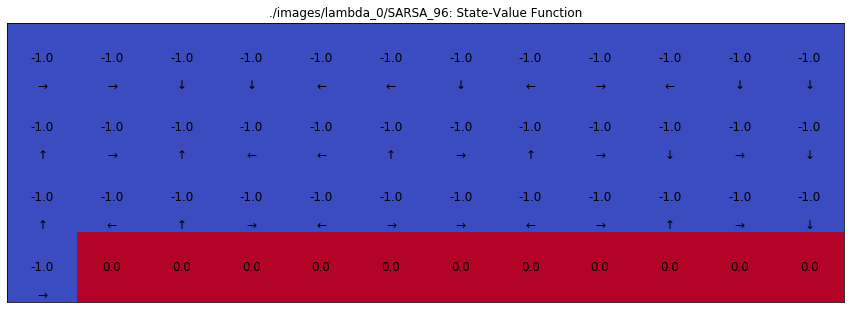

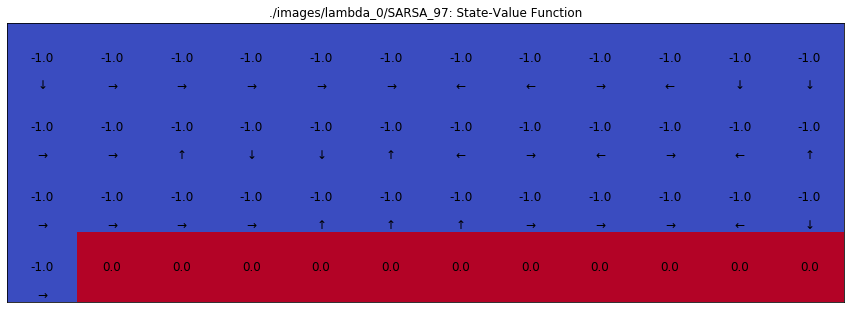

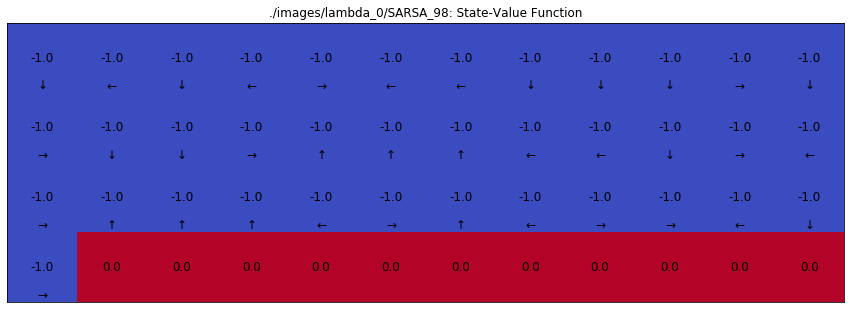

Episode 100/200.

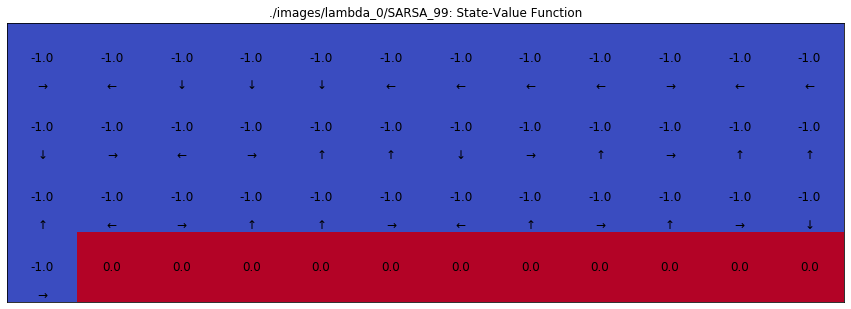

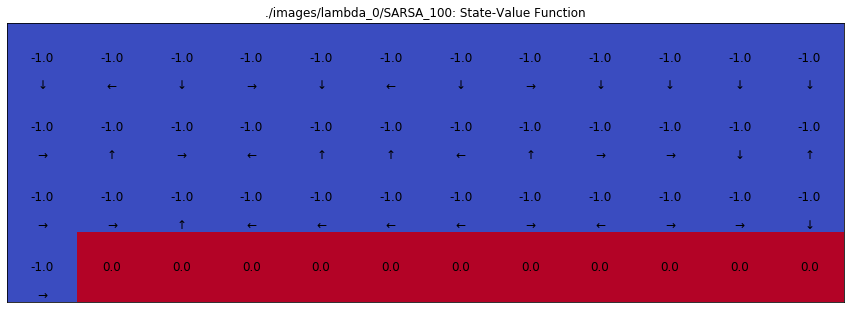

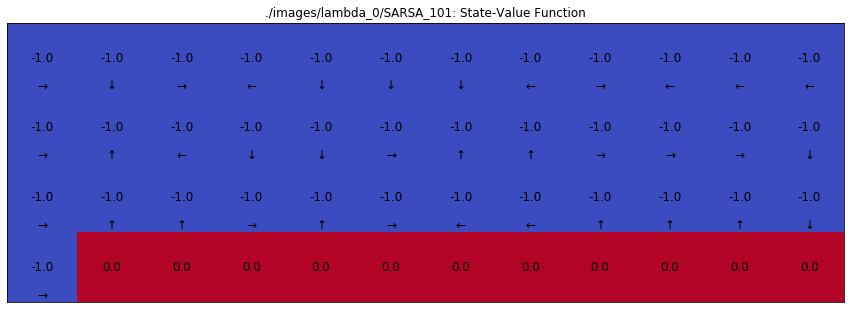

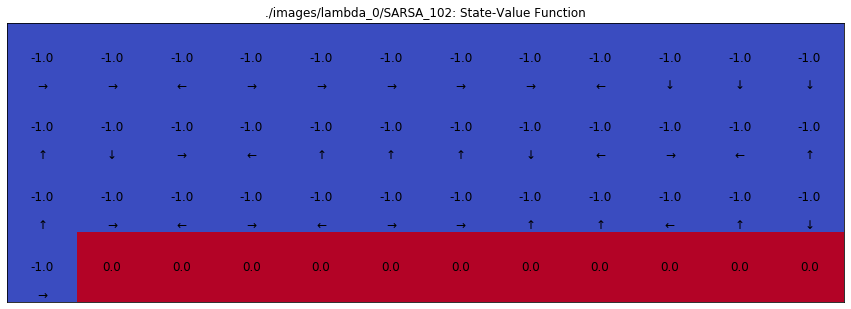

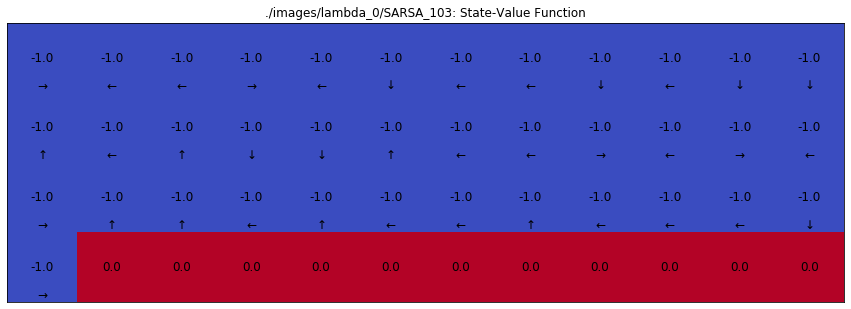

...

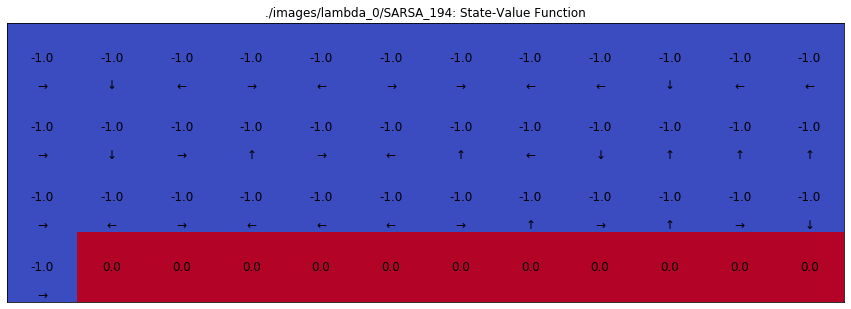

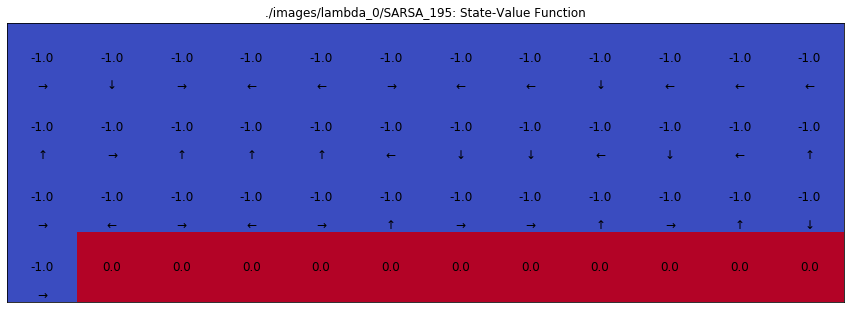

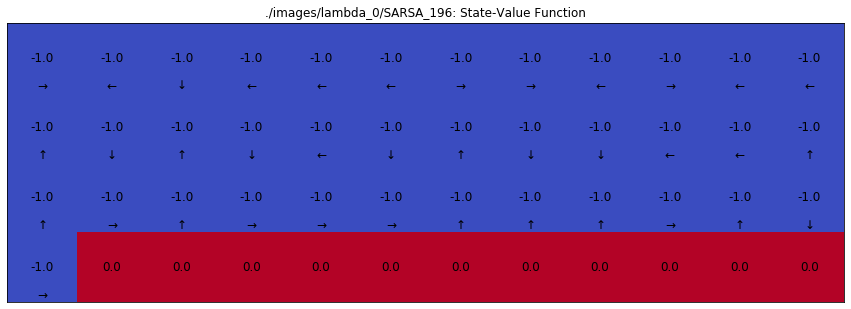

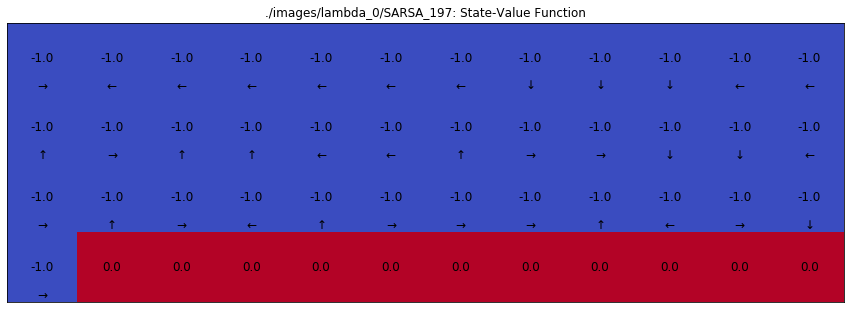

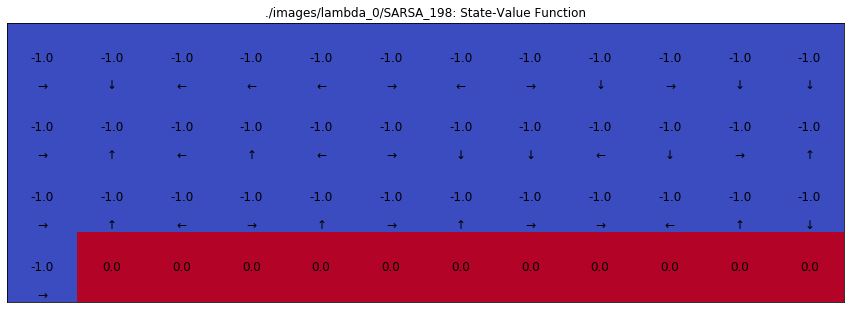

Episode 200/200.

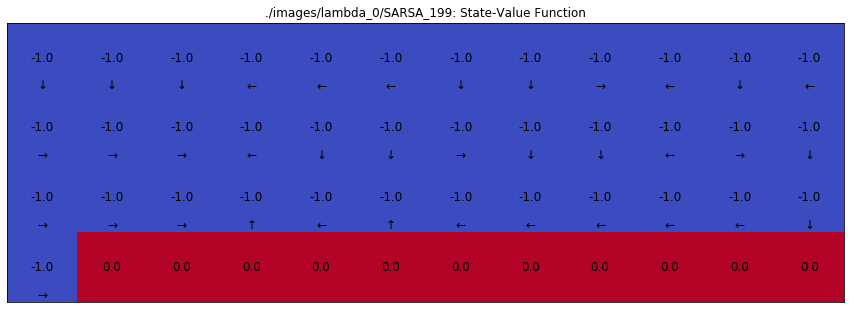

Stats(episode_lengths=array([ 462., 1127., 1103.,  784.,  168., 1132.,  536.,  764.,  500.,
        762.,  100., 1153.,  540.,  374.,  575.,  132.,  895.,  354.,
        273.,  748.,  479.,  854.,   73.,  435., 1293.,  542., 1809.,
        421.,  100.,  531.,  554.,  178.,  870.,  418.,  224., 1504.,
        137.,  460.,   58.,  417.,  768.,  467.,  636.,  128.,  191.,
       1209.,  358.,  178.,  248., 1787.,  214., 1140.,  635.,  851.,
         83.,  232.,  693.,  515.,  107.,  423.,  125., 1137.,  159.,
        332.,  351., 1231.,  278., 1815.,  602.,  303.,  135.,  330.,
        339.,  455.,  970.,  178.,  595.,  904.,  878.,  196.,  284.,
        171.,  869.,  647.,  710.,  375.,  905.,  158., 2370., 1316.,
       1505., 1203., 1019., 1153., 1653.,  513.,  266.,  525.,  947.,
       1599., 1395.,  520.,  881.,  937., 1817.,  114., 1007.,  498.,
        847., 1551.,  514.,  465.,  220.,  122.,  568.,  115.,  102.,
        214.,  175.,  123., 2070.,  704.,  702.,  608., 1895., 1234.

In [108]:
runSarsa(num_episodes=200,lambda_=0,discount_factor=1,epsilon=0.1,alpha=0.5,print_=True)

SARSA



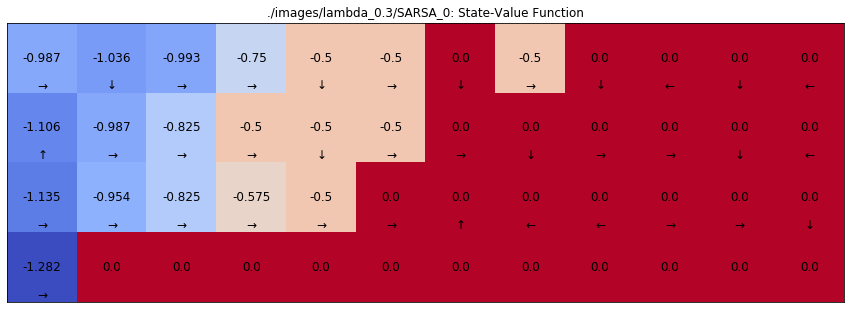

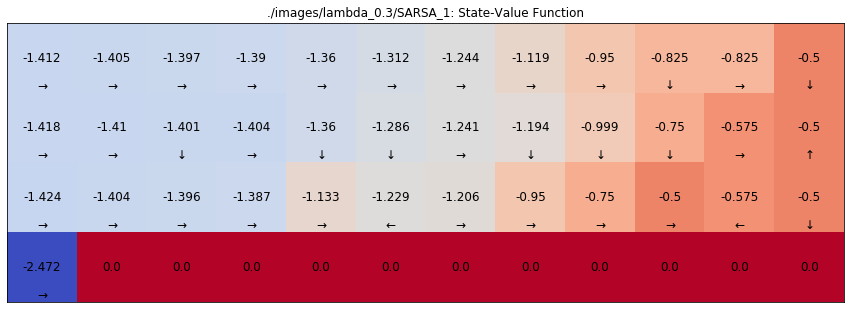

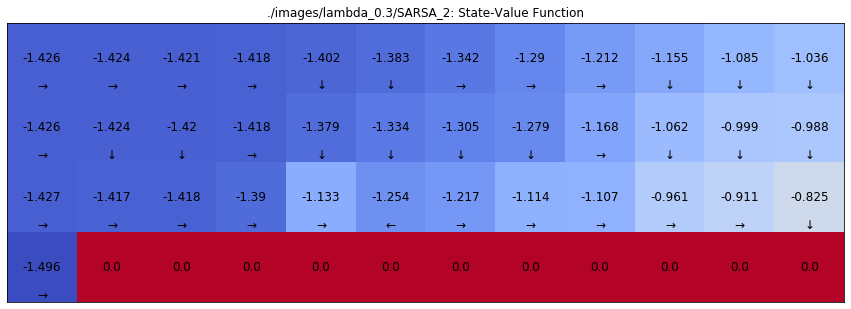

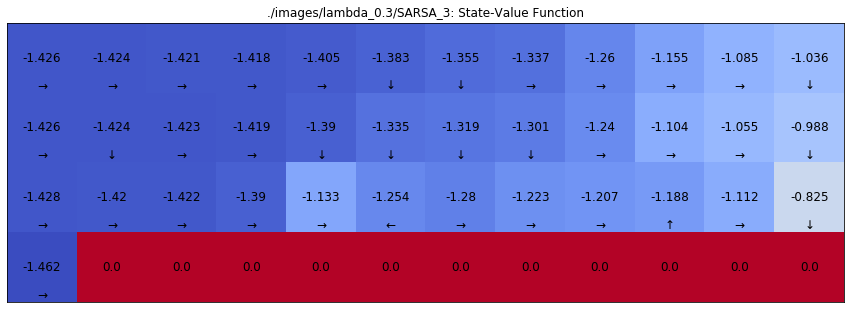

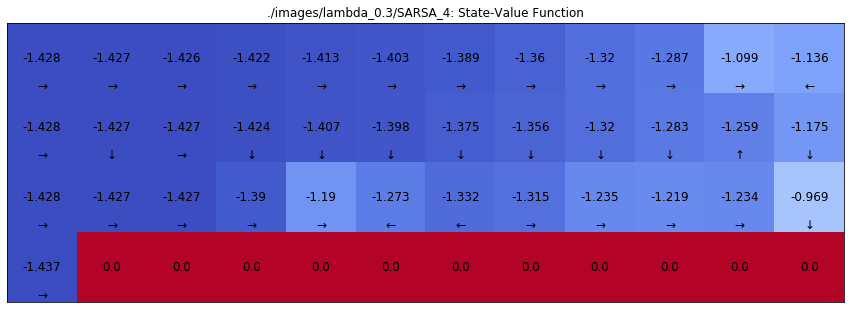

...

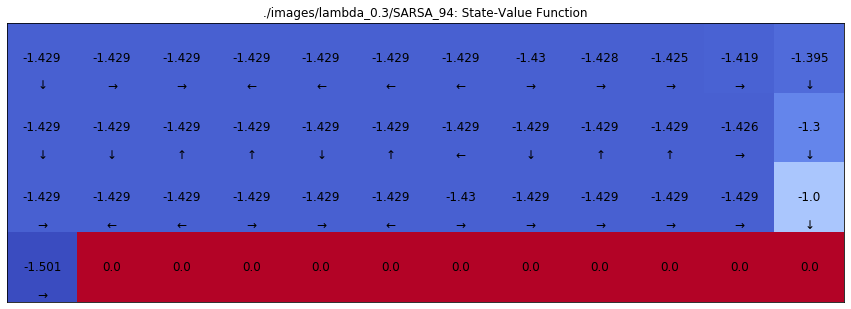

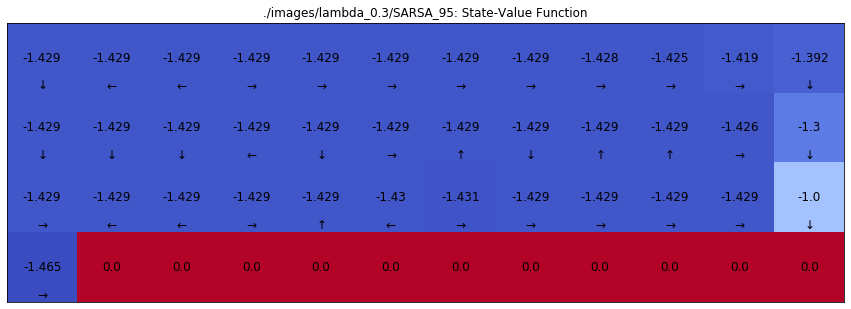

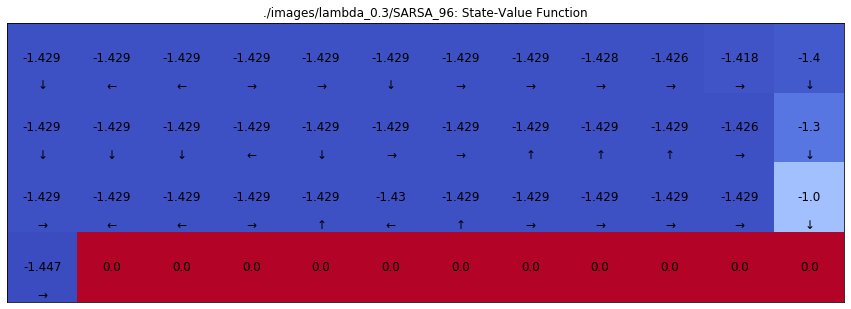

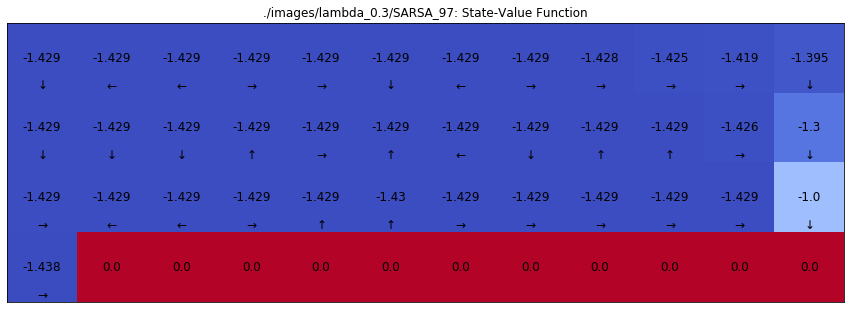

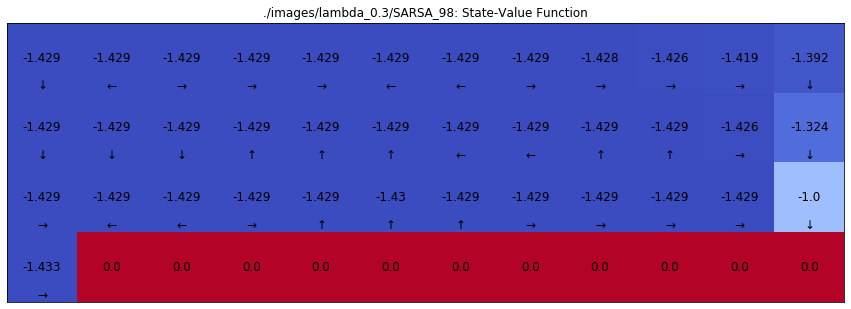

Episode 100/200.

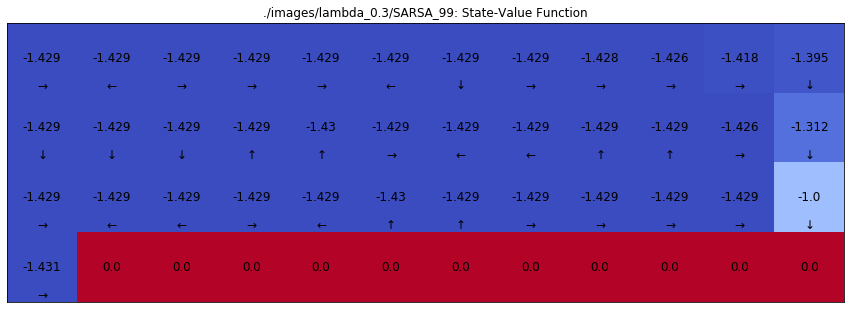

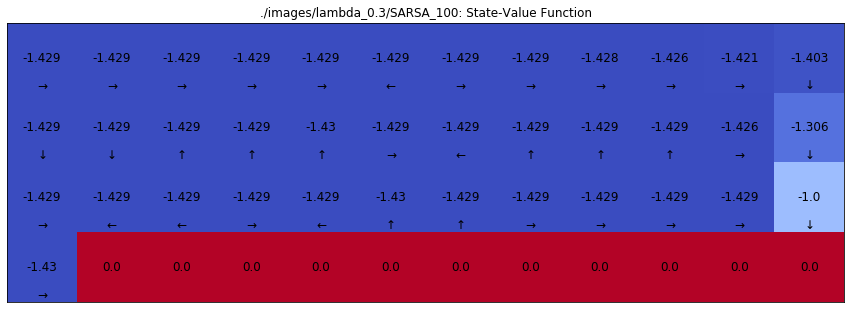

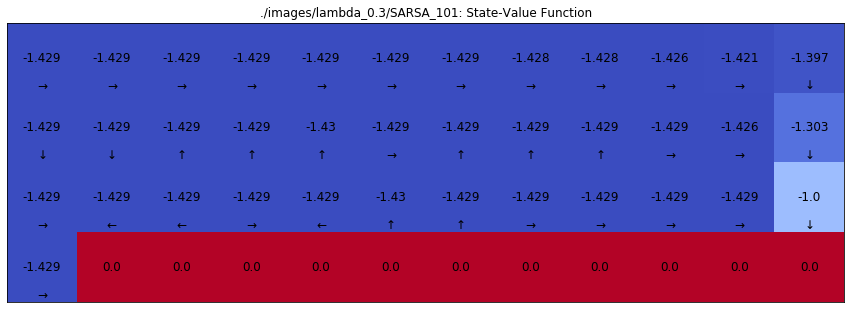

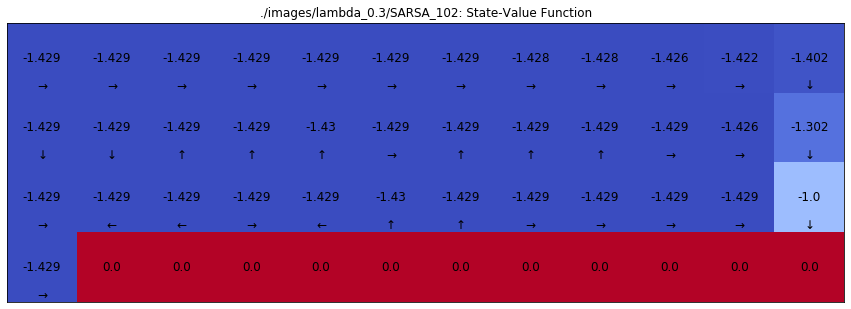

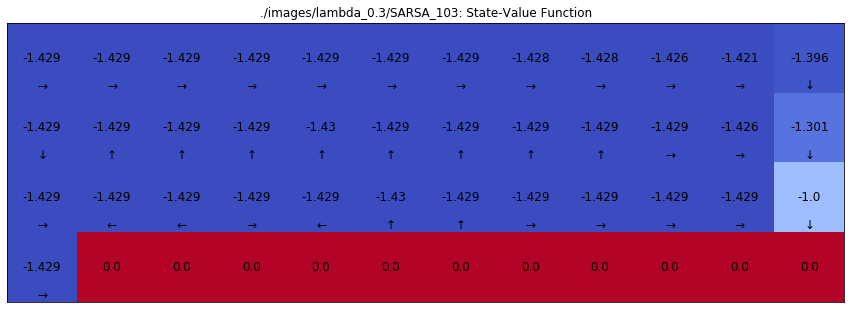

...

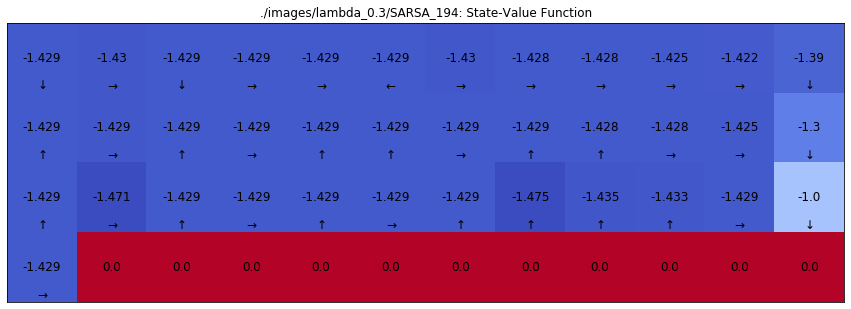

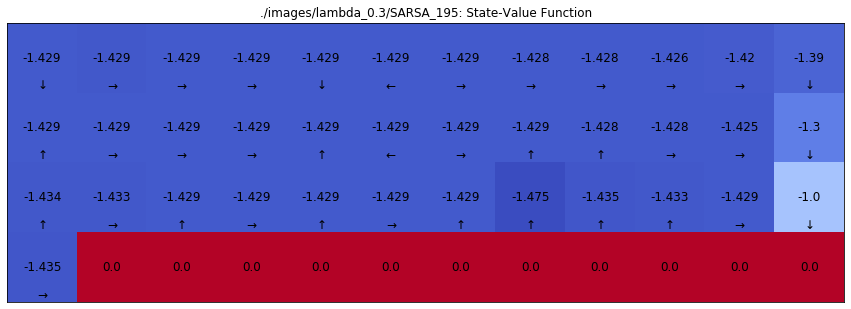

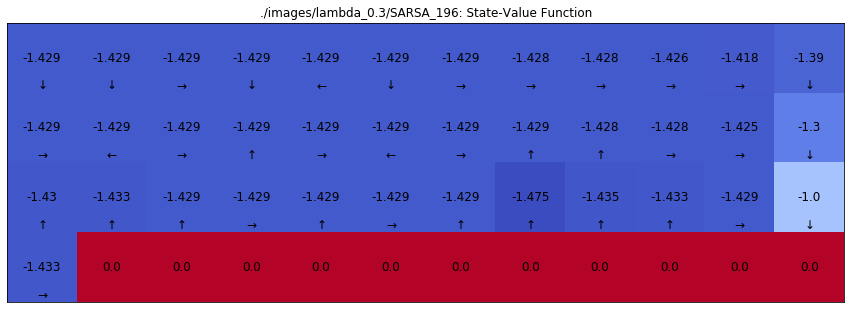

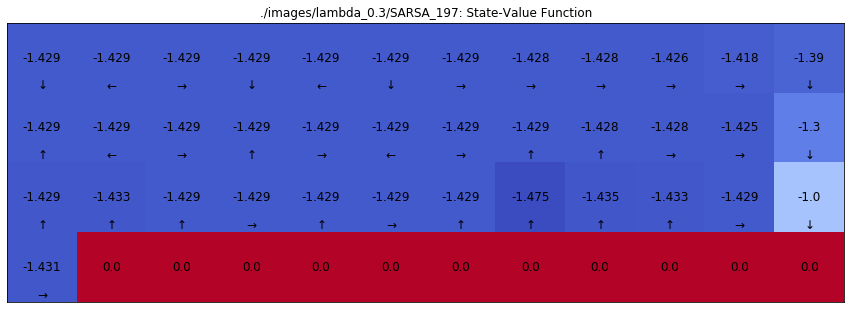

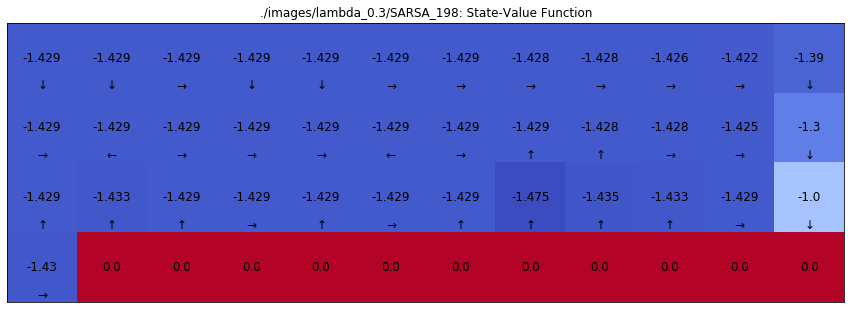

Episode 200/200.

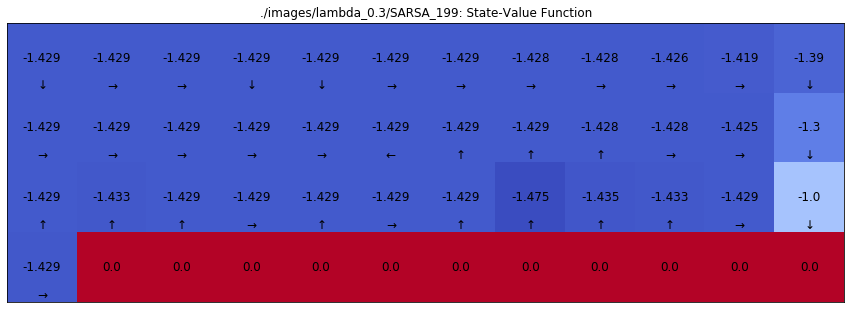

Stats(episode_lengths=array([2.04000e+02, 6.71000e+02, 3.05000e+02, 4.90000e+01, 2.10000e+02,
       7.40000e+01, 1.63000e+02, 4.00000e+01, 7.90000e+01, 1.91000e+02,
       4.80000e+01, 3.20000e+01, 6.20000e+01, 6.60000e+01, 4.60000e+01,
       7.70000e+01, 5.70000e+01, 6.00000e+01, 6.60000e+01, 5.70000e+01,
       4.40000e+01, 2.70000e+01, 8.50000e+01, 1.60000e+01, 6.90000e+01,
       5.90000e+01, 3.80000e+01, 3.80000e+01, 2.30000e+01, 3.20000e+01,
       2.20000e+01, 2.30000e+01, 2.80000e+01, 7.80000e+01, 2.70000e+01,
       1.60822e+05, 2.81800e+03, 3.90640e+04, 1.06691e+05, 2.29000e+02,
       3.70000e+01, 1.22600e+03, 1.72000e+02, 9.90000e+01, 4.60000e+01,
       2.47000e+02, 8.10000e+01, 2.15000e+02, 3.26000e+02, 1.46000e+02,
       1.63000e+02, 1.02000e+02, 4.64000e+02, 1.31000e+02, 8.40000e+01,
       2.70000e+01, 1.32000e+02, 4.88000e+02, 5.60000e+01, 3.00000e+01,
       2.20000e+01, 8.60000e+01, 5.70000e+01, 3.90000e+01, 7.80000e+01,
       8.50000e+01, 1.90000e+01, 6.20000e+

In [109]:
runSarsa(num_episodes=200,lambda_=0.3,discount_factor=1,epsilon=0.1,alpha=0.5,print_=True)

SARSA



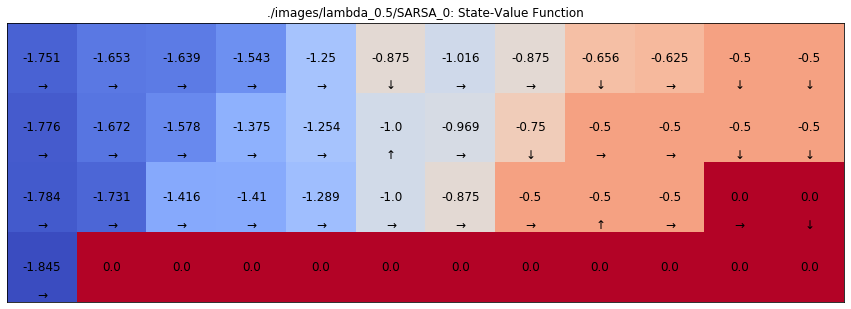

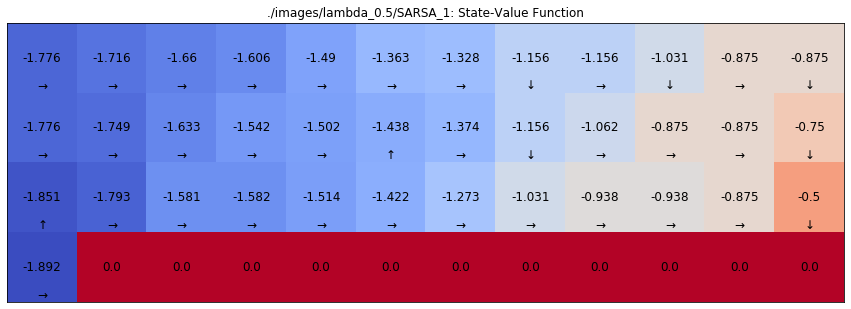

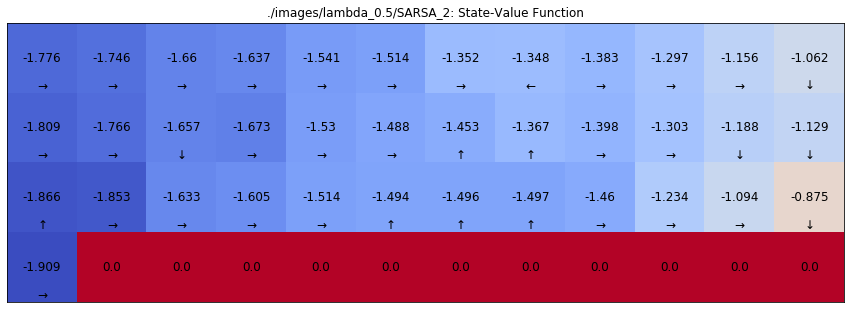

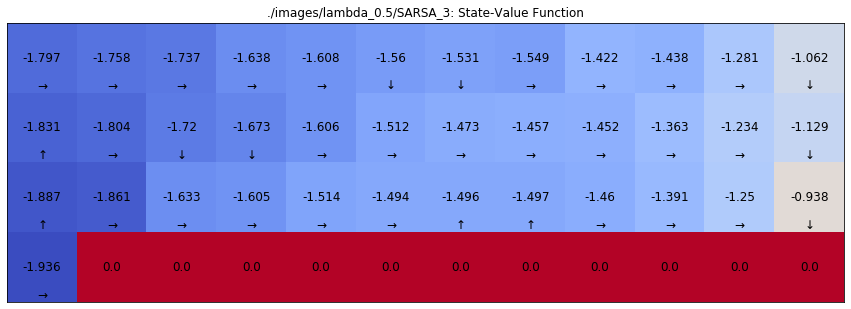

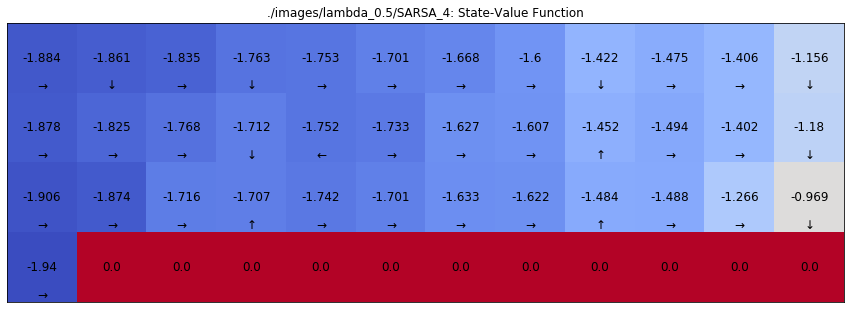

...

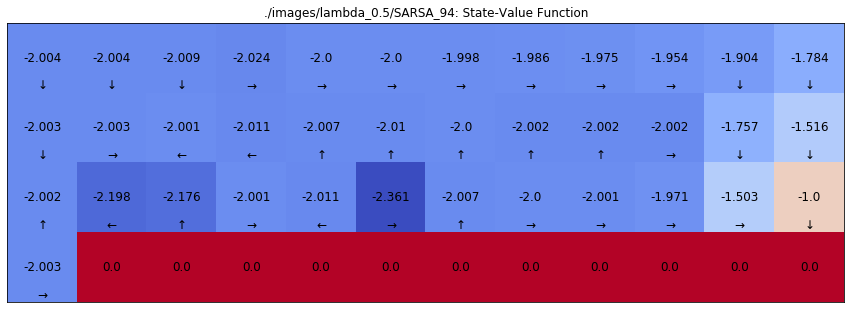

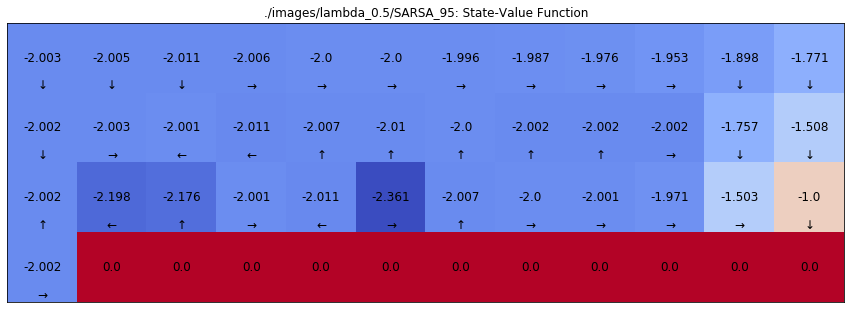

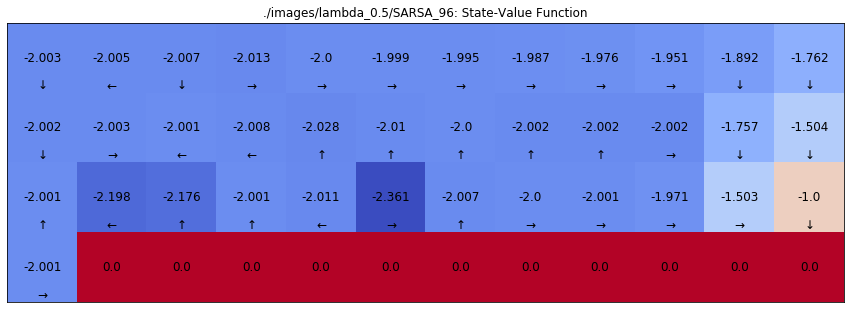

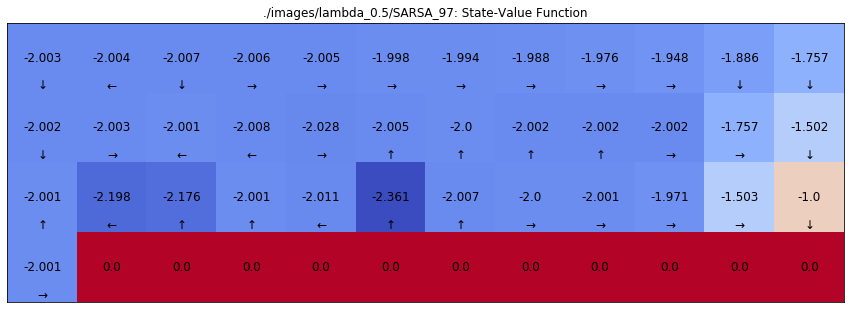

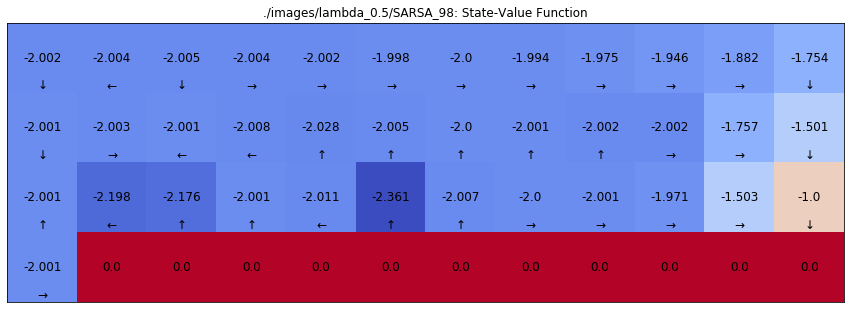

Episode 100/200.

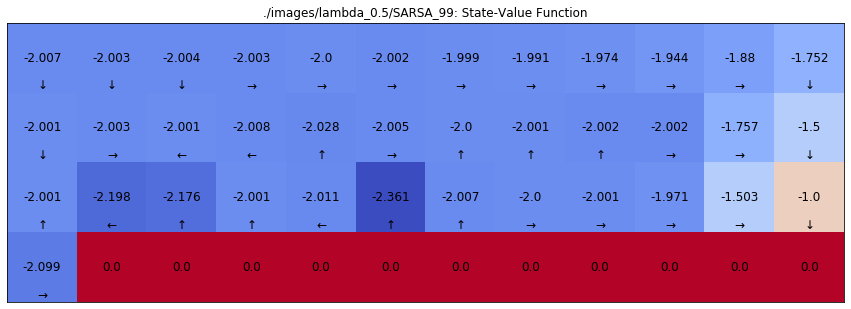

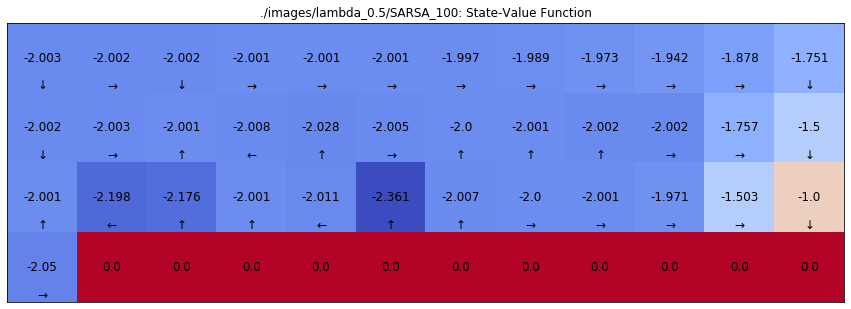

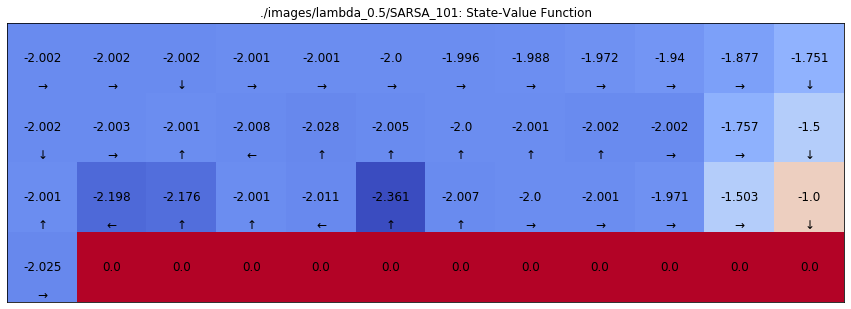

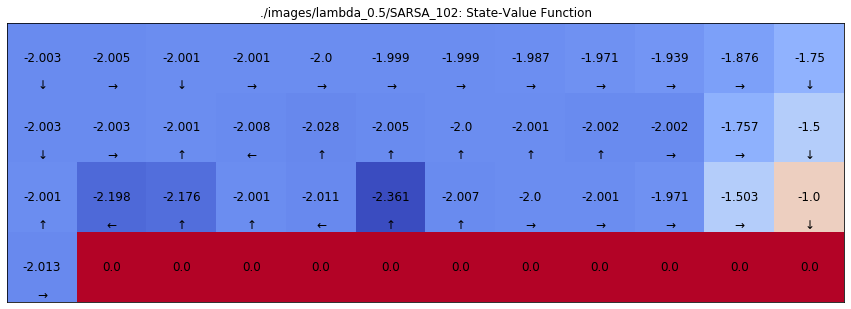

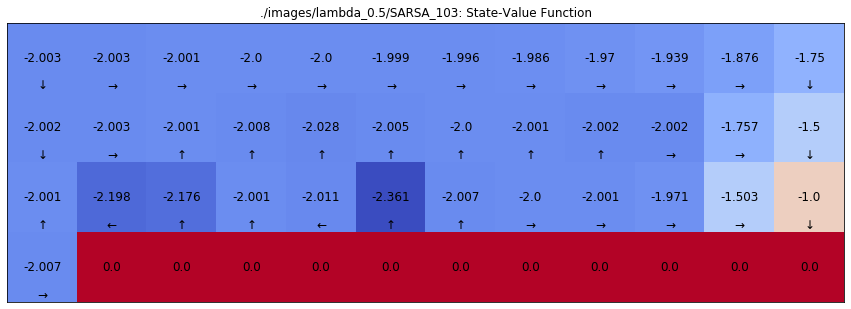

...

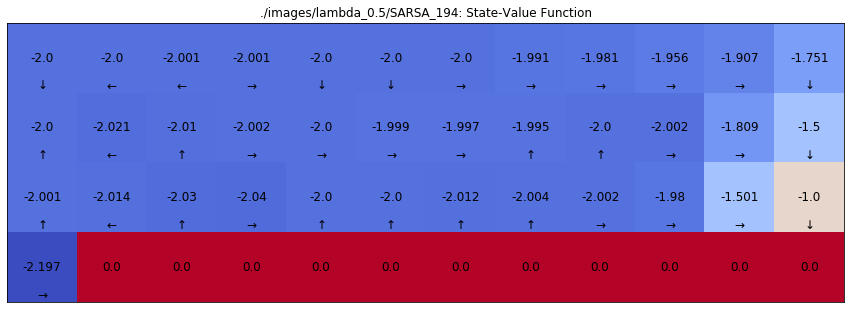

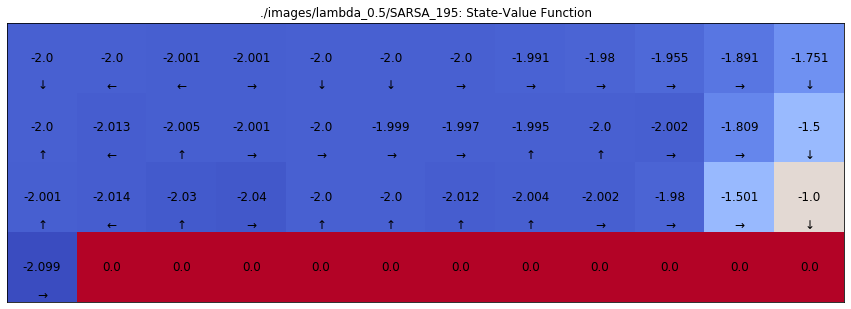

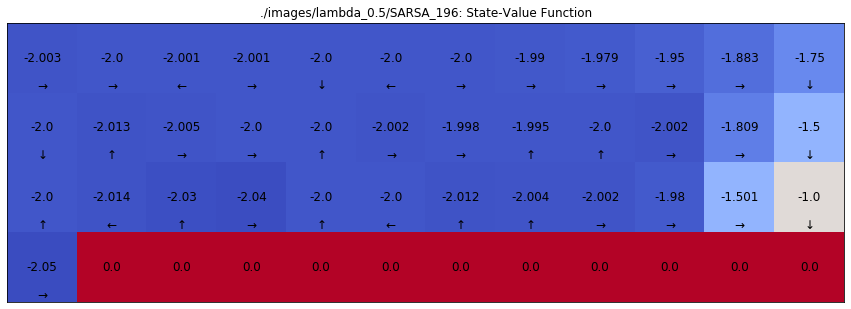

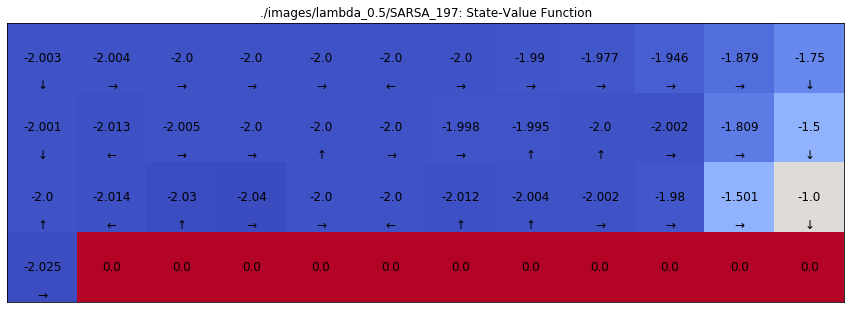

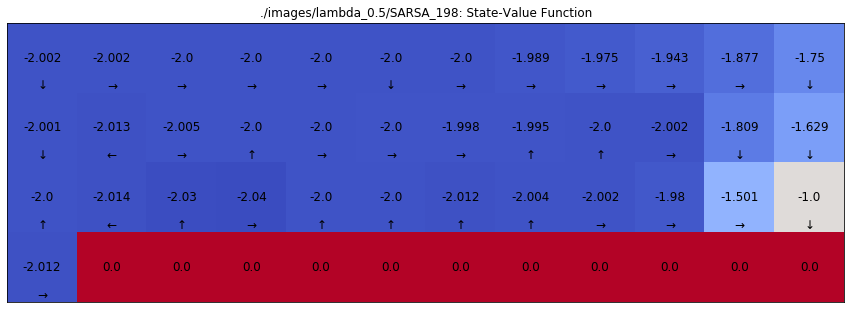

Episode 200/200.

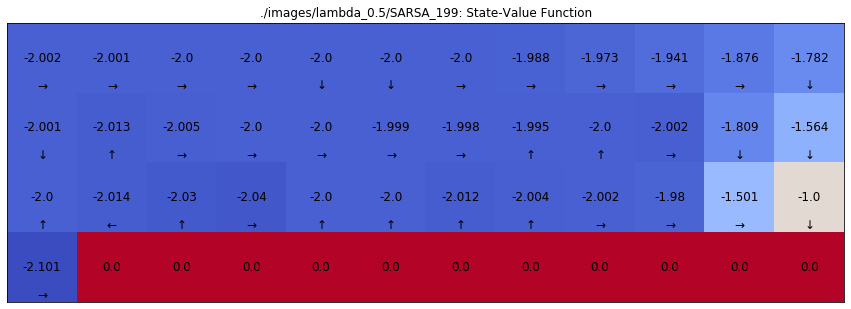

Stats(episode_lengths=array([5.4400e+02, 1.6100e+02, 1.1600e+02, 5.5000e+01, 1.3900e+02,
       3.6000e+01, 1.5300e+02, 2.2000e+01, 7.5000e+01, 1.2700e+02,
       1.8000e+01, 7.6000e+01, 2.9000e+01, 1.3700e+02, 4.3000e+01,
       6.1000e+01, 4.1000e+01, 9.0000e+01, 4.6000e+01, 4.5000e+01,
       5.9000e+01, 3.9000e+01, 7.0000e+01, 2.9000e+01, 2.7000e+01,
       4.9000e+01, 3.3000e+01, 4.1000e+01, 2.5000e+01, 3.8000e+01,
       1.0200e+02, 5.0000e+01, 3.7000e+01, 2.4000e+01, 5.5000e+01,
       3.0000e+01, 2.7000e+01, 2.3000e+01, 3.2000e+01, 4.8000e+01,
       4.1000e+01, 4.7000e+01, 3.3000e+01, 2.4000e+01, 3.9000e+01,
       6.5000e+01, 2.8000e+01, 4.6000e+01, 3.3000e+01, 2.5000e+01,
       3.0000e+01, 2.2000e+01, 3.4000e+01, 1.3070e+03, 2.3400e+03,
       1.1900e+02, 2.6000e+01, 1.8400e+02, 9.7000e+01, 2.8000e+01,
       2.3000e+01, 1.1200e+02, 3.1000e+01, 3.2000e+01, 5.1000e+01,
       6.4000e+01, 6.7020e+03, 4.5900e+02, 8.5850e+03, 1.6728e+04,
       3.0300e+02, 3.6700e+02, 1.0400e+0

In [110]:
runSarsa(num_episodes=200,lambda_=0.5,discount_factor=1,epsilon=0.1,alpha=0.5,print_=True)

## Returns for different lambdas, averages over 100 runs

In [179]:
all_episode_stats_0 = runSarsa(num_episodes=200,lambda_=0,discount_factor=1,epsilon=0.1,alpha=0.5,print_=False,plot_episode_ret=True,num_runs=100)

SARSA_run_0

SARSA_run_1

SARSA_run_2

SARSA_run_3

SARSA_run_4

SARSA_run_5

SARSA_run_6

SARSA_run_7

SARSA_run_8

SARSA_run_9

SARSA_run_10

SARSA_run_11

SARSA_run_12

SARSA_run_13

SARSA_run_14

SARSA_run_15

SARSA_run_16

SARSA_run_17

SARSA_run_18

SARSA_run_19

SARSA_run_20

SARSA_run_21

SARSA_run_22

SARSA_run_23

SARSA_run_24

SARSA_run_25

SARSA_run_26

SARSA_run_27

SARSA_run_28

SARSA_run_29

SARSA_run_30

SARSA_run_31

SARSA_run_32

SARSA_run_33

SARSA_run_34

SARSA_run_35

SARSA_run_36

SARSA_run_37

SARSA_run_38

SARSA_run_39

SARSA_run_40

SARSA_run_41

SARSA_run_42

SARSA_run_43

SARSA_run_44

SARSA_run_45

SARSA_run_46

SARSA_run_47

SARSA_run_48

SARSA_run_49

SARSA_run_50

SARSA_run_51

SARSA_run_52

SARSA_run_53

SARSA_run_54

SARSA_run_55

SARSA_run_56

SARSA_run_57

SARSA_run_58

SARSA_run_59

SARSA_run_60

SARSA_run_61

SARSA_run_62

SARSA_run_63

SARSA_run_64

SARSA_run_65

SARSA_run_66

SARSA_run_67

SARSA_run_68

SARSA_run_69

SARSA_run_70

SARSA_run_71

SA

In [180]:
all_episode_stats_03 = runSarsa(num_episodes=200,lambda_=0.3,discount_factor=1,epsilon=0.1,alpha=0.5,print_=False,plot_episode_ret=True,num_runs=100)

SARSA_run_0

SARSA_run_1

SARSA_run_2

SARSA_run_3

SARSA_run_4

SARSA_run_5

SARSA_run_6

SARSA_run_7

SARSA_run_8

SARSA_run_9

SARSA_run_10

SARSA_run_11

SARSA_run_12

SARSA_run_13

SARSA_run_14

SARSA_run_15

SARSA_run_16

SARSA_run_17

SARSA_run_18

SARSA_run_19

SARSA_run_20

SARSA_run_21

SARSA_run_22

SARSA_run_23

SARSA_run_24

SARSA_run_25

SARSA_run_26

SARSA_run_27

SARSA_run_28

SARSA_run_29

SARSA_run_30

SARSA_run_31

SARSA_run_32

SARSA_run_33

SARSA_run_34

SARSA_run_35

SARSA_run_36

SARSA_run_37

SARSA_run_38

SARSA_run_39

SARSA_run_40

SARSA_run_41

SARSA_run_42

SARSA_run_43

SARSA_run_44

SARSA_run_45

SARSA_run_46

SARSA_run_47

SARSA_run_48

SARSA_run_49

SARSA_run_50

SARSA_run_51

SARSA_run_52

SARSA_run_53

SARSA_run_54

SARSA_run_55

SARSA_run_56

SARSA_run_57

SARSA_run_58

SARSA_run_59

SARSA_run_60

SARSA_run_61

SARSA_run_62

SARSA_run_63

SARSA_run_64

SARSA_run_65

SARSA_run_66

SARSA_run_67

SARSA_run_68

SARSA_run_69

SARSA_run_70

SARSA_run_71

SA

In [181]:
all_episode_stats_05 = runSarsa(num_episodes=200,lambda_=0.5,discount_factor=1,epsilon=0.1,alpha=0.5,print_=False,plot_episode_ret=True,num_runs=100)

SARSA_run_0

SARSA_run_1

SARSA_run_2

SARSA_run_3

SARSA_run_4

SARSA_run_5

SARSA_run_6

SARSA_run_7

SARSA_run_8

SARSA_run_9

SARSA_run_10

SARSA_run_11

SARSA_run_12

SARSA_run_13

SARSA_run_14

SARSA_run_15

SARSA_run_16

SARSA_run_17

SARSA_run_18

SARSA_run_19

SARSA_run_20

SARSA_run_21

SARSA_run_22

SARSA_run_23

SARSA_run_24

SARSA_run_25

SARSA_run_26

SARSA_run_27

SARSA_run_28

SARSA_run_29

SARSA_run_30

SARSA_run_31

SARSA_run_32

SARSA_run_33

SARSA_run_34

SARSA_run_35

SARSA_run_36

SARSA_run_37

SARSA_run_38

SARSA_run_39

SARSA_run_40

SARSA_run_41

SARSA_run_42

SARSA_run_43

SARSA_run_44

SARSA_run_45

SARSA_run_46

SARSA_run_47

SARSA_run_48

SARSA_run_49

SARSA_run_50

SARSA_run_51

SARSA_run_52

SARSA_run_53

SARSA_run_54

SARSA_run_55

SARSA_run_56

SARSA_run_57

SARSA_run_58

SARSA_run_59

SARSA_run_60

SARSA_run_61

SARSA_run_62

SARSA_run_63

SARSA_run_64

SARSA_run_65

SARSA_run_66

SARSA_run_67

SARSA_run_68

SARSA_run_69

SARSA_run_70

SARSA_run_71

SA

In [243]:
def episode_to_panda(all_episode_stats,label):
    stats_df = pd.DataFrame([])
    for stat in all_episode_stats:
        stats_df = stats_df.append(pd.DataFrame(stat.episode_rewards,columns=[label]).T)
    return stats_df

In [244]:
stats_df_0 = episode_to_panda(all_episode_stats_0,"lambda_0")
stats_df_03 = episode_to_panda(all_episode_stats_03,"lambda_0.3")
stats_df_05 = episode_to_panda(all_episode_stats_05,"lambda_0.5")

In [269]:
def plot_rewards(stats_df,ax,label):
    means = stats_df.mean()
    errors = stats_df.std()
    means.plot(yerr=errors,figsize=(20,15),ax=ax,label=label,legend=True)

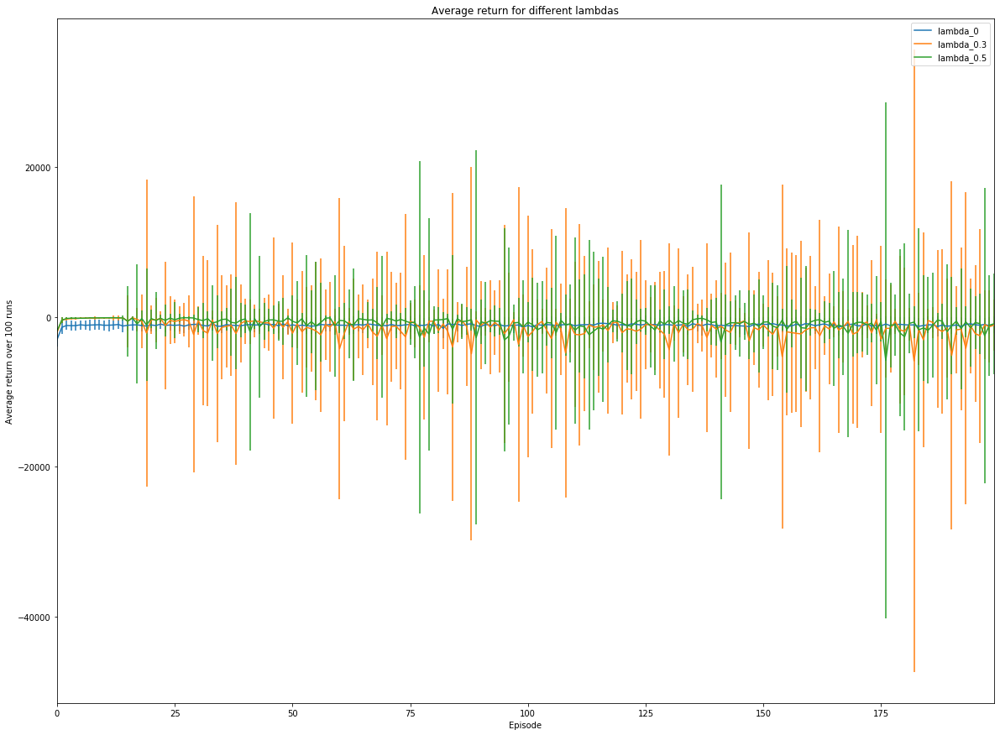

In [272]:
fig, ax = plt.subplots()
# ax.set_ylim((-20000, 20000))
ax.set_title("Average return for different lambdas")
ax.set_xlabel("Episode")
ax.set_ylabel("Average return over 100 runs")
plot_rewards(stats_df_0,ax,"lambda_0")
plot_rewards(stats_df_03,ax,"lambda_0.3")
plot_rewards(stats_df_05,ax,"lambda_0.5")
fig.savefig("rewards_diff_lambda.png")
plt.show()